In [1]:
#importing packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
%matplotlib inline

In [2]:
chessboardPath = "./output_images/chessboard"
testImagesPath = "./output_images/test_images"

outCamCalPath = chessboardPath + "/undistorted"
if not os.path.exists(outCamCalPath):
    if not os.path.exists(chessboardPath):
        os.mkdir(chessboardPath)
    os.mkdir(outCamCalPath)

outCornersPath = chessboardPath + "/corners"
if not os.path.exists(outCornersPath):
    if not os.path.exists(chessboardPath):
        os.mkdir(chessboardPath)
    os.mkdir(outCornersPath)   
    
outUndistortedPath = testImagesPath + "/undistorted"
if not os.path.exists(outUndistortedPath):
    if not os.path.exists(testImagesPath):
        os.mkdir(testImagesPath)
    os.mkdir(outUndistortedPath)   
    
outBinaryPath = testImagesPath + "/binary"
if not os.path.exists(outBinaryPath):
    if not os.path.exists(testImagesPath):
        os.mkdir(testImagesPath)
    os.mkdir(outBinaryPath)

outWarpPath = testImagesPath + "/warp"
if not os.path.exists(outWarpPath):
    if not os.path.exists(testImagesPath):
        os.mkdir(testImagesPath)
    os.mkdir(outWarpPath)

outFinalImagePath = testImagesPath + "/final"
if not os.path.exists(outFinalImagePath):
    if not os.path.exists(testImagesPath):
        os.mkdir(testImagesPath)
    os.mkdir(outFinalImagePath)

outLaneLinesPath = testImagesPath + "/lanelines"
if not os.path.exists(outLaneLinesPath):
    if not os.path.exists(testImagesPath):
        os.mkdir(testImagesPath)
    os.mkdir(outLaneLinesPath)
    

### Camera Calibration

In [3]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
figureSize = (16, 8)
    
def loadData(folder):
    data = []
    for file in os.listdir(folder):
        data.append(folder + file)
    return np.array(data)

def saveImage(path, file, img):
    # save the image
    filename = (file.split('/')[-1]).split('.')[0]+'.png'
    plt.imsave(os.path.join(path, filename), img) 
    
def calibrateCamera (chessboardImage, x = nx, y = ny):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)  # x, y coordinates

    # Arrays to store object points and image points from all the images.
    objPoints = [] # 3d point in real world space
    imgPoints = [] # 2d points in image plane    
    
    # read chessboard images
    for file in chessboardImage:
        img = cv2.imread(file)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (x,y), None)
        if ret == True:
            objPoints.append(objp)
            imgPoints.append(corners)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img.shape[0:2], None, None)
    return mtx, dist, (img.shape[1], img.shape[0])

def undistortImage(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def printUndistortedChessboard (img, undist, mtx, distCoe, x = nx, y = ny, file = None, save = False):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    cnr = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
    # Plot chessboard images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figureSize)
    ax1.set_title('Original Chessboard')
    ax1.imshow(img)
    ax2.set_title('Distortion Corrected Chessboard')
    ax2.imshow(undist)
    if (save and file is not None):
        saveImage(outCornersPath, file, cnr)
        saveImage(outCamCalPath, file, undist)


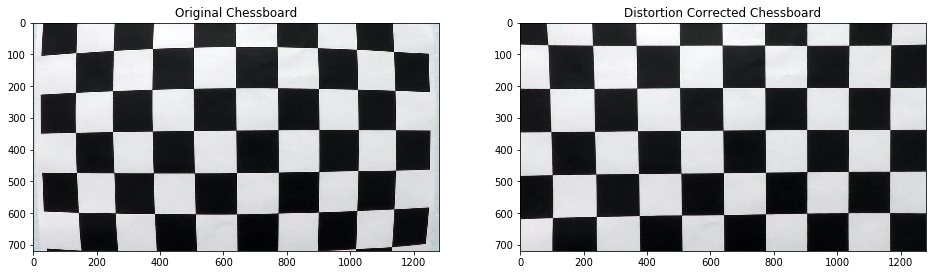

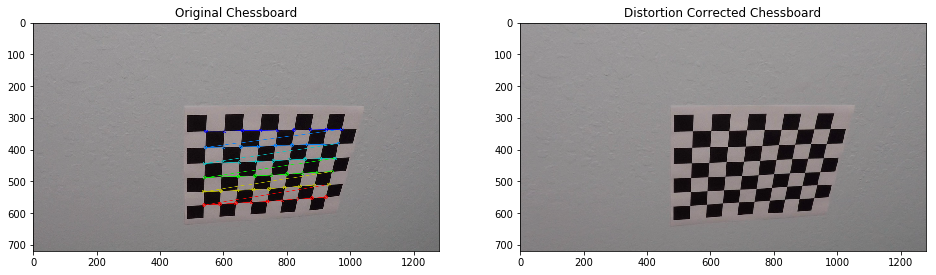

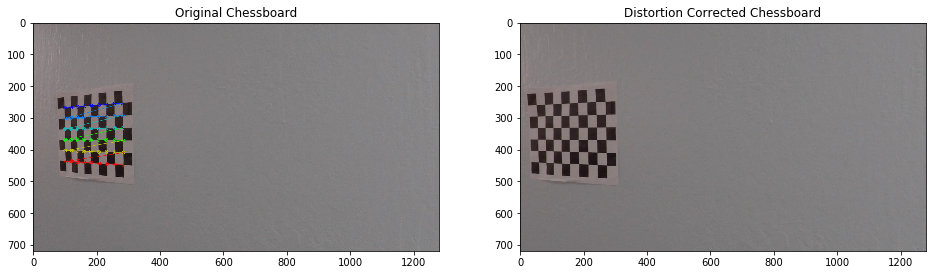

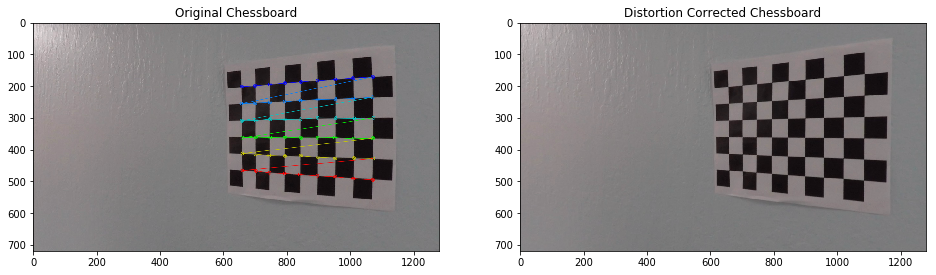

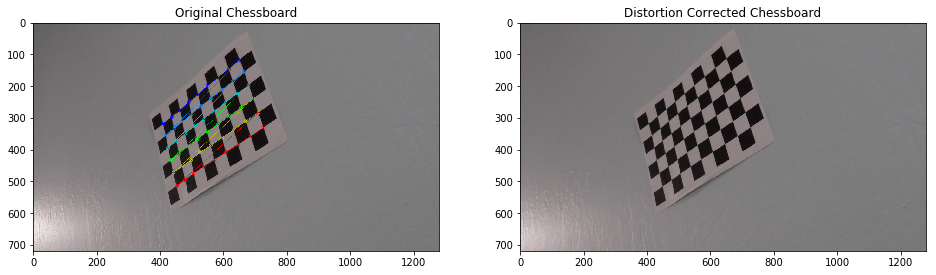

...

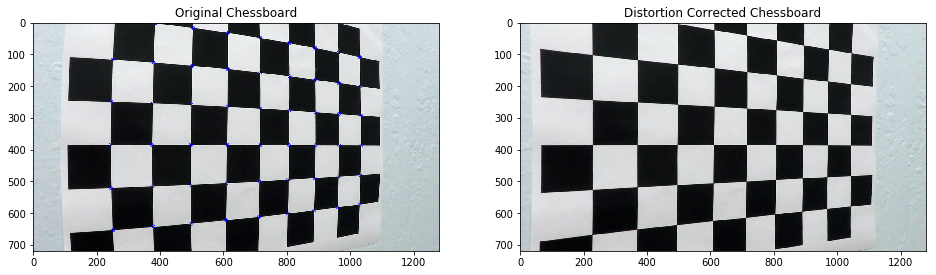

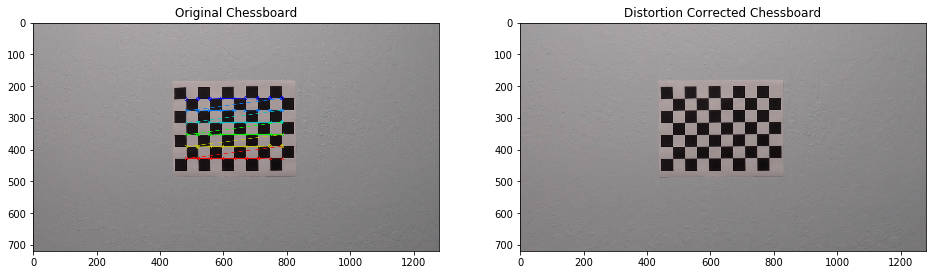

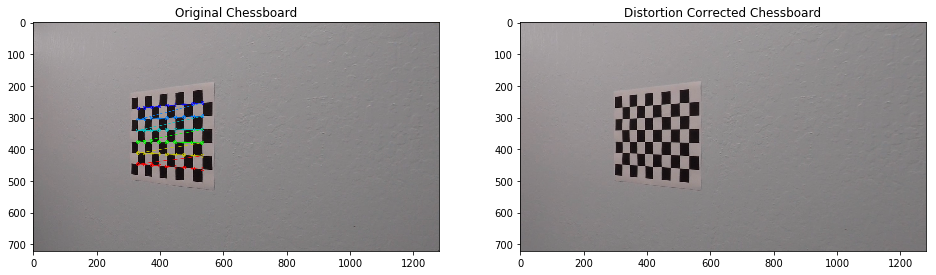

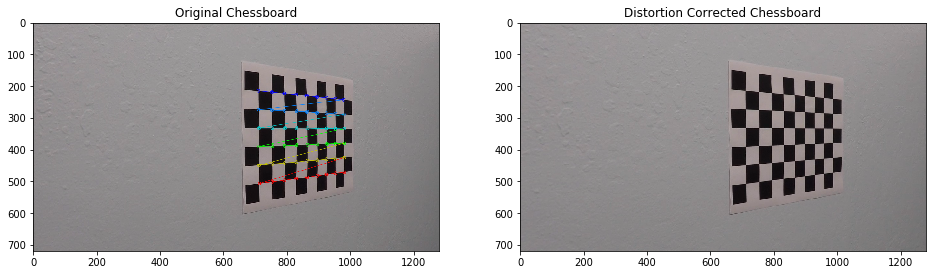

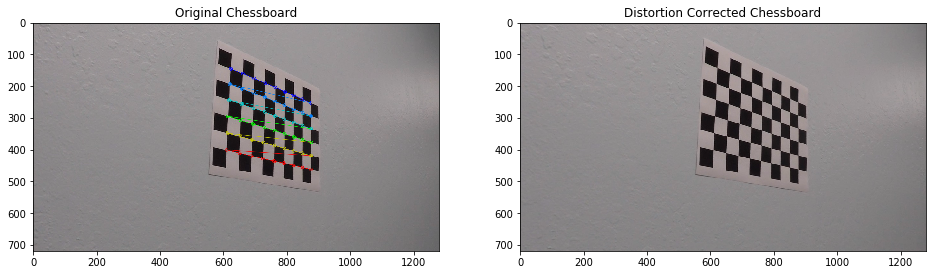

In [4]:
# Camera calibration, Distortion correction
chessboardImages = loadData("camera_cal/")
mtx, distCoe, imgSize = calibrateCamera(chessboardImages)
for file in chessboardImages:
    image = cv2.imread(file)
    undist = undistortImage(image, mtx, distCoe)
    printUndistortedChessboard(image, undist, mtx, distCoe, file=file, save=True)


### Color / Gradient Threshold

In [139]:
def gaussian_blur(img, kernel_size=5):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def gradThreshold(img, orient='x', sobelKernel=3, gradThreshold=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'y':
        absSobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobelKernel))
    else:
        absSobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobelKernel))
    
    scaledSobel = np.uint8(255*absSobel/np.max(absSobel)) # Rescale to 8-bit integer
    # Create a copy and apply the threshold
    gradBinary = np.zeros_like(scaledSobel)
    gradBinary[(scaledSobel >= gradThreshold[0]) & (scaledSobel <= gradThreshold[1])] = 1
    return gradBinary

# Define a function that thresholds the S-channel of HLS
def hlsThreshold(img, hlsThreshold=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    hlsBinary = np.zeros_like(sChannel)
    hlsBinary[(sChannel > hlsThreshold[0]) & (sChannel <= hlsThreshold[1])] = 1
    return hlsBinary

# Define a function that thresholds the L-channel of LUV
def luvThreshold(img, luvThreshold=(0, 255)):
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2Luv)
    lChannel = luv[:,:,0]
    luvBinary = np.zeros_like(lChannel)
    luvBinary[(lChannel > luvThreshold[0]) & (lChannel <= luvThreshold[1])] = 1
    return luvBinary

# Define a function that thresholds the b-channel of Lab
def labThreshold(img, labThreshold=(0, 255)):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    bChannel = lab[:,:,2]
    labBinary = np.zeros_like(bChannel)
    labBinary[(bChannel > labThreshold[0]) & (bChannel <= labThreshold[1])] = 1
    return labBinary

def colorGradientImage(img):
    hlsBinary = hlsThreshold(img, hlsThreshold=(175, 255))
    luvBinary = luvThreshold(img, luvThreshold=(215, 255))
    gradBinary = gradThreshold(img, gradThreshold=(25, 120))
    
    # Combine the two binary thresholds
    combinedBinary = np.zeros_like(hlsBinary)
    combinedBinary[(hlsBinary == 1) | (luvBinary == 1) | (gradBinary == 1)] = 1    
    return hlsBinary, luvBinary, gradBinary, combinedBinary

def printColorGradientImages(hls, luv, gradient, combined):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=figureSize)

    ax1.set_title('Sobel x Gradient Threshold')
    ax1.imshow(gradient, cmap='gray')
    
    ax2.set_title('S Channel Binary')
    ax2.imshow(hls, cmap='gray')
    
    ax3.set_title('L Channel Binary')
    ax3.imshow(luv, cmap='gray')

    ax4.set_title('Combined Thresholds')
    ax4.imshow(combined, cmap='gray')
  

### Perspective Transform

In [140]:
def imageVertices(imgSize):
    offset = 320
    # bottom-left, top-left, top-right, bottom-right
    src = np.float32([[240, imgSize[1]], [580, 460], [imgSize[1], 460], [1120, imgSize[1]]])
    dst = np.float32([[offset, imgSize[1]], [offset, 0], [imgSize[0]-offset, 0], [imgSize[0]-offset, imgSize[1]]])
    return src, dst

def perspectiveTransform(src, dst):
    perp = cv2.getPerspectiveTransform(src, dst)
    perpInv = cv2.getPerspectiveTransform(dst, src)
    return perp, perpInv

def warpImage(img, pt):
    width, height = img.shape[1], img.shape[0]
    return cv2.warpPerspective(img, pt, (width, height), flags=cv2.INTER_LINEAR)

def printUndistortedImages(img, undist):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figureSize)
    ax1.set_title('Original Image')
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    ax2.set_title('Distortion Corrected Image')
    ax2.imshow(cv2.cvtColor(undist,cv2.COLOR_BGR2RGB))

def printWarpedImages(img, warp, binary, src, dst):
    # draw a trapezium
    src = np.array(src, np.int32)
    srcX = [src[0][0], src[1][0], src[2][0], src[3][0]]
    srcY = [src[0][1], src[1][1], src[2][1], src[3][1]]
    # draw a rectangle
    dst = np.array(dst, np.int32)
    dstX = [dst[0][0], dst[1][0], dst[2][0], dst[3][0]]
    dstY = [dst[0][1], dst[1][1], dst[2][1], dst[3][1]]
    
    # Plot warped images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=figureSize)
    ax1.set_title('Original Image with Source Points')
    ax1.plot(srcX, srcY, color='r', linewidth=3)
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    ax2.set_title('Warp Image')
    ax2.plot(dstX, dstY, color='r', linewidth=3)
    ax2.imshow(cv2.cvtColor(warp,cv2.COLOR_BGR2RGB))     
    ax3.set_title('Binary Warp Image')
    ax3.plot(dstX, dstY, color='r', linewidth=3)
    ax3.imshow(binary,cmap ='gray')
  

### Region of Interest Mask

In [141]:
def regionOfInterest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channelCount = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignoreMaskColor = (255,) * channelCount
    else:
        ignoreMaskColor = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignoreMaskColor)
    
    #returning the image only where mask pixels are nonzero
    maskedImage = cv2.bitwise_and(img, mask)
    return maskedImage

### Find Lane Lines

In [142]:
margin = 100 # width of the windows +/- margin

def findInitLanes(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return out_img, left_fit, right_fit, left_fitx, right_fitx, ploty
    
def findNextLanes(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    #return ploty, left_fitx, right_fitx, left_lane_inds, right_lane_inds, nonzerox, nonzeroy
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return ploty, out_img, window_img, left_fitx, right_fitx

def printNextLanes(binary_warped, ploty, out_img, window_img, left_fitx, right_fitx):
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    return cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
   

### Find Curvature

In [143]:
def findCurvature(img, xLeft, xRight):
    yPlot = np.linspace(0, img.shape[0]-1, img.shape[0])
    yEval = np.max(yPlot)

    # Define conversions in x and y from pixels space to meters
    yMPerPix = 30/720 # meters per pixel in y dimension
    xMPerPix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    leftFitCR = np.polyfit(yPlot*yMPerPix, xLeft*xMPerPix, 2)
    rightFitCR = np.polyfit(yPlot*yMPerPix, xRight*xMPerPix, 2)
    # Calculate the new radii of curvature, in meters
    leftCurveRadius = ((1 + (2*leftFitCR[0]*yEval*yMPerPix + leftFitCR[1])**2)**1.5) / np.absolute(2*leftFitCR[0])
    rightCurveRadius = ((1 + (2*rightFitCR[0]*yEval*yMPerPix + rightFitCR[1])**2)**1.5) / np.absolute(2*rightFitCR[0])
    #print(leftCurveRadius, "m,", rightCurveRadius, "m")
    return leftCurveRadius, rightCurveRadius

def toRealWorldScale(img, warped, Minv, left_fitx, right_fitx, ploty):
    # Create an image to draw the lines on
    colorWarp = np.zeros_like(warped).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    leftPoints = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    rightPoints = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((leftPoints, rightPoints))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(colorWarp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newWarp = cv2.warpPerspective(colorWarp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newWarp, 0.3, 0)
    return result

def findCarPosition(carCenter, left, right):
    # Find the position of the car from the center
    # It will show if the car is 'x' meters from the left or right  
    laneCenter = (left[0] + right[0])/2
    # Define conversions in x and y from pixels space to meters
    xMPerPix = 3.7/700 # meters per pixel in x dimension   
    return (laneCenter-carCenter)*xMPerPix


In [144]:
def printLanes(initLanes, init_left_fitx, init_right_fitx, ploty, img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figureSize)
    ax1.set_title('Lane Lines with Sliding Windows')
    ax1.imshow(initLanes)
    ax1.plot(init_left_fitx, ploty, color='yellow')
    ax1.plot(init_right_fitx, ploty, color='yellow')
    
    ax2.set_title('Color Fit Lane Area')
    ax2.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

In [145]:
def pipeline(image, file = None, save = False):
    image = gaussian_blur(image)
    undist = undistortImage(image, mtx, distCoe)
    if (save and file is not None):
        printUndistortedImages(image, undist)
        saveImage(outUndistortedPath, file, cv2.cvtColor(undist,cv2.COLOR_BGR2RGB))
    
    # perspective transform
    srcVertices, dstVertices = imageVertices(imgSize)
    pXform, pXformInv = perspectiveTransform(srcVertices, dstVertices)
    warp = warpImage(undist, pXform)
        
    # color / gradient threshold
    hlsBin, luvBin, gradBin, warpBin = colorGradientImage(warp)
    if (save and file is not None):
        printColorGradientImages(hlsBin, luvBin, gradBin, warpBin)
        saveImage(outBinaryPath, file, warpBin)

    if (save and file is not None):
        printWarpedImages(undist, warp, warpBin, srcVertices, dstVertices) 
        saveImage(outWarpPath, file, warpBin)
        
    # mask region of interest
    #vertices = np.array([[210, imgSize[1]], [550, 440], [imgSize[1], 440], [1150, imgSize[1]]])
    #combinedBin = regionOfInterest(combinedBin, [vertices])
    
    return warpBin, pXformInv

C:\Users\WheeCheng\Miniconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


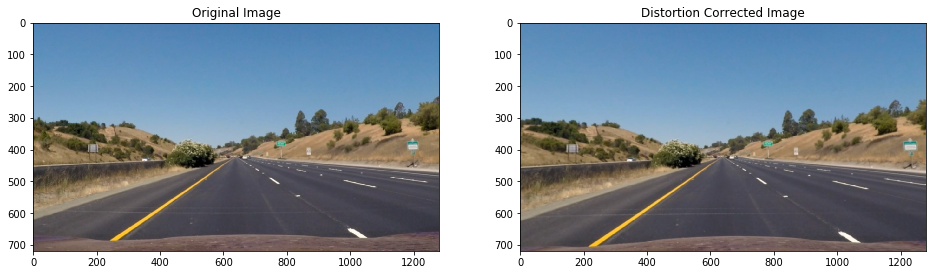

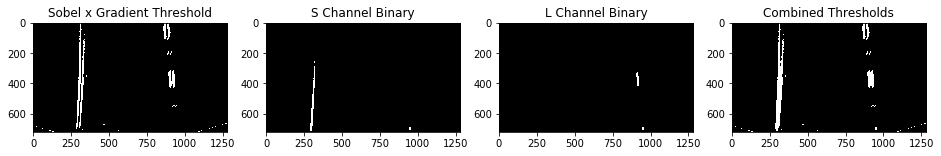

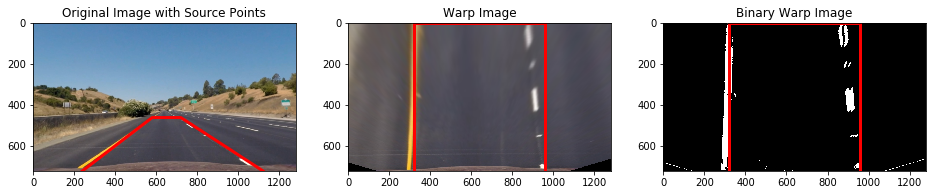

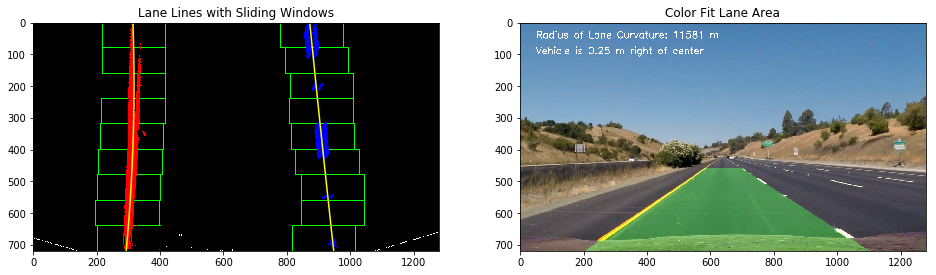

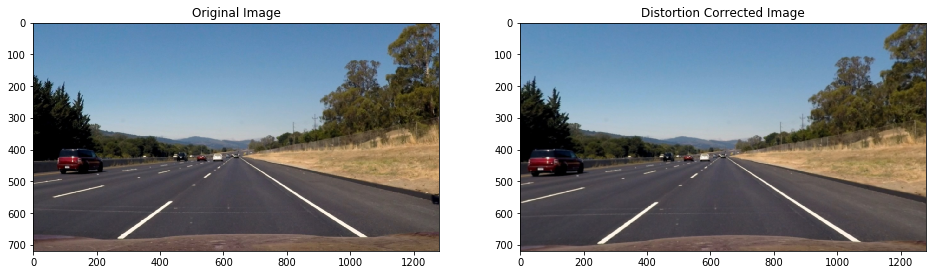

...

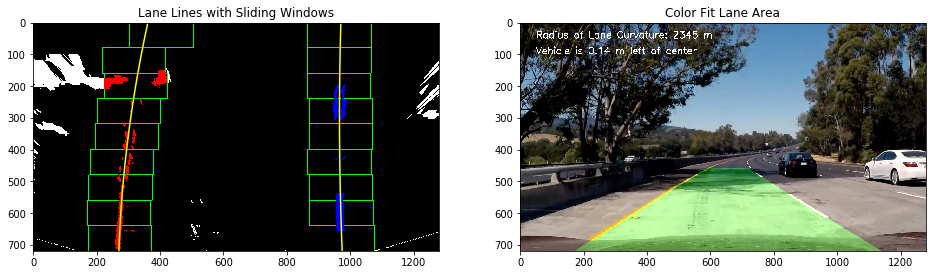

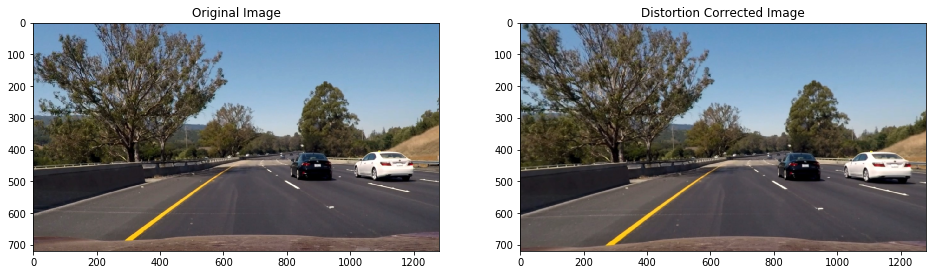

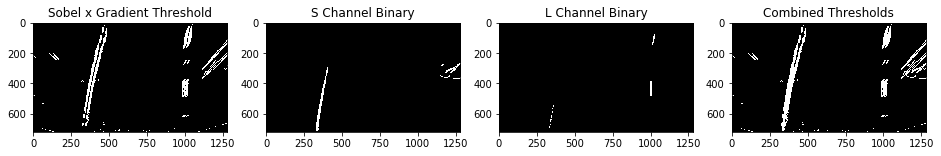

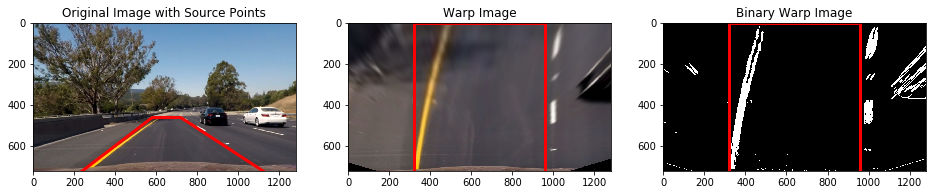

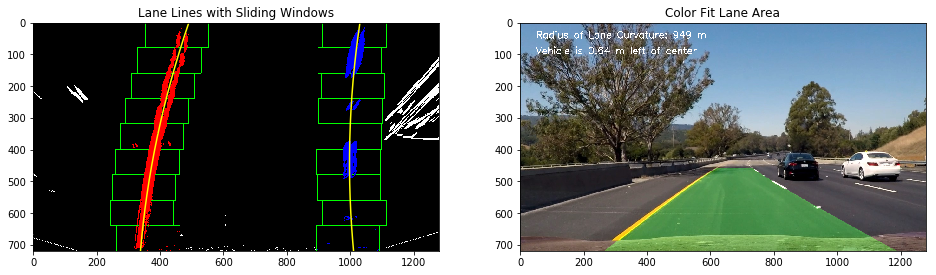

In [146]:
def processTestImages(save = False):
    testImages = loadData("test_images/")
    for file in testImages:
        image = cv2.imread(file)
        binWarp, Minv = pipeline(image, file, save)
        # find lane lines
        initLaneLines, initLeftFit, initRightFit, initXLeftFit, initXRightFit, yPlot = findInitLanes(binWarp)
        if (save and file is not None):
            saveImage(outLaneLinesPath, file, initLaneLines)
        leftCurve, rightCurve = findCurvature(binWarp, initXLeftFit, initXRightFit)

        imgRealWorld = toRealWorldScale(image, initLaneLines, Minv, initXLeftFit, initXRightFit, yPlot)
        meanCurve = np.mean([leftCurve, rightCurve])
        carPosition = findCarPosition(image.shape[1]/2, initXLeftFit, initXRightFit)
    
        # Annotate image with text
        font = cv2.FONT_HERSHEY_SIMPLEX
        text = "Radius of Lane Curvature: {:.0f} m".format(meanCurve)
        cv2.putText(imgRealWorld, text, (50,50), font, 1, (255,255,255), 2)
        if carPosition < 0:
            text = "Vehicle is {:.2f} m right of center".format(-carPosition)
        else:
            text = "Vehicle is {:.2f} m left of center".format(carPosition)
        cv2.putText(imgRealWorld, text, (50,100), font, 1, (255,255,255), 2)
        if (save and file is not None):
            printLanes(initLaneLines, initXLeftFit, initXRightFit, yPlot, imgRealWorld)
            saveImage(outFinalImagePath, file, cv2.cvtColor(imgRealWorld,cv2.COLOR_BGR2RGB))

processTestImages(True)

### Video Processing

In [147]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [154]:
FILTER_SIZE = 20
prevBin, leftFitBuffer, rightFitBuffer, initLeftFit, initRightFit = None, None, None, None, None

def process_image(image):
    global prevBin, leftFitBuffer, rightFitBuffer, initLeftFit, initRightFit
    
    binWarp, Minv = pipeline(image)
    # find lane lines
    if prevBin is None:
        initLaneLines, initLeftFit, initRightFit, initXLeftFit, initXRightFit, yPlot = findInitLanes(binWarp)
    yPlot, outImg, windowImg, xLeftFit, xRightFit = findNextLanes(binWarp, initLeftFit, initRightFit)
    leftCurve, rightCurve = findCurvature(binWarp, xLeftFit, xRightFit)
    
    if prevBin is None:
        prevBin = binWarp
    ret = cv2.matchShapes(prevBin,binWarp,1,0.0)
    if ret < 50:
        prevBin = binWarp

        if leftFitBuffer is None:
            leftFitBuffer = np.array([xLeftFit])

        if rightFitBuffer is None:
            rightFitBuffer = np.array([xRightFit])

        leftFitBuffer = np.append(leftFitBuffer, [xLeftFit], axis=0)[-FILTER_SIZE:]
        rightFitBuffer = np.append(rightFitBuffer, [xRightFit], axis=0)[-FILTER_SIZE:]
        
    # Compute the mean
    leftFitMean = np.mean(leftFitBuffer, axis=0)
    rightFitMean = np.mean(rightFitBuffer, axis=0)
    
    imgRealWorld = toRealWorldScale(image, outImg, Minv, xLeftFit, xRightFit, yPlot)
    meanCurve = np.mean([leftCurve, rightCurve])
    carPosition = findCarPosition(image.shape[1]/2, xLeftFit, xRightFit)
    
    # Annotate image with text
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Lane Curvature: {:.0f} m".format(meanCurve)
    cv2.putText(imgRealWorld, text, (50,50), font, 1, (255,255,255), 2)
    if carPosition < 0:
        text = "Vehicle is {:.2f} m right of center".format(-carPosition)
    else:
        text = "Vehicle is {:.2f} m left of center".format(carPosition)
    cv2.putText(imgRealWorld, text, (50,100), font, 1, (255,255,255), 2)
    imgRealWorld = np.array(imgRealWorld)
    return imgRealWorld

In [155]:
outVideoPath = "./output_images/video"
if not os.path.exists(outVideoPath):
    os.mkdir(outVideoPath)

filename = "project_video_output.mp4"
projectVideoOutput = os.path.join(outVideoPath, filename)    
    
clip1 = VideoFileClip("./project_video.mp4")
video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time video_clip.write_videofile(projectVideoOutput, audio=False)    


[MoviePy] >>>> Building video ./output_images/video\project_video_output.mp4
[MoviePy] Writing video ./output_images/video\project_video_output.mp4


100%|█████████▉| 1260/1261 [04:06<00:00,  5.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/video\project_video_output.mp4 

Wall time: 4min 8s
